# 1. Getting Started: Airbnb Copenhagen

This assignment deals with the most recent Airbnb listings in Copenhagen. The data is collected from [Inside Airbnb](http://insideairbnb.com/copenhagen). Feel free to explore the website further in order to better understand the data. The data (*listings.csv*) has been collected as raw data and needs to be preprocessed.

**Hand-in:** Hand in as a group in Itslearning in a **single**, well-organized and easy-to-read Jupyter Notebook. Please just use this notebook to complete the assignment.

If your group consists of students from different classes, upload in **both** classes.

The first cell does some preprocessing. Please just run these cells and do not change anything. The assignment starts below. Make sure that listings.csv' is in the same folder as this notebook




,id,name,host_id,host_name,neighbourhood_cleansed,latitude,longitude,room_type,price,minimum_nights,...,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,reviews_per_month,calculated_host_listings_count,availability_365,price_category
0,6983,Copenhagen 'N Livin',16774,Simon,Nørrebro,55.686410,12.547410,Entire home/apt,898.0,3,...,4.79,4.78,4.86,4.89,4.73,4.71,1.08,1,0,0
1,26057,Lovely house - most attractive area,109777,Kari,Indre By,55.693070,12.576490,Entire home/apt,2600.0,4,...,4.93,4.96,4.93,4.86,4.94,4.81,0.55,1,303,1
2,26473,City Centre Townhouse Sleeps 1-10 persons,112210,Julia,Indre By,55.676020,12.575400,Entire home/apt,3250.0,3,...,4.63,4.44,4.78,4.70,4.89,4.59,2.06,3,56,1
3,29118,Best Location in Cool Istedgade,125230,Nana,Vesterbro-Kongens Enghave,55.670230,12.555040,Entire home/apt,725.0,7,...,4.87,4.73,5.00,5.00,4.87,4.80,0.16,1,59,0
4,31094,"Beautiful, spacious, central, renovated Penthouse",129976,Ebbe,Vesterbro-Kongens Enghave,55.666602,12.555283,Entire home/apt,1954.0,3,...,4.82,4.88,4.87,4.82,4.80,4.53,0.13,1,0,1


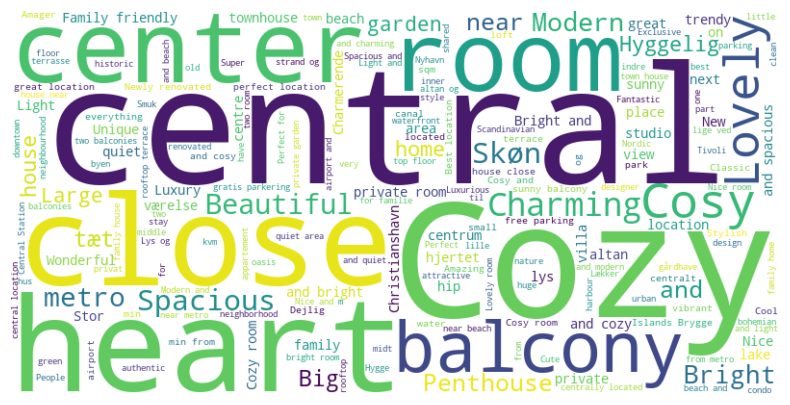

In [25]:
# pip install pandas
# pip install scikit-learn
import pandas as pd
import sklearn as sk

# load the data
data = pd.read_csv('listings.csv')

# filter relevant columns
data_limited = data[["id",
    "name",
    "host_id"  ,
    "host_name" , 
    "neighbourhood_cleansed"  ,
    "latitude"  ,
    "longitude"  ,
    "room_type"  ,
    "price"  ,
    "minimum_nights"  ,
    "number_of_reviews",  
    "last_review"  ,
    "review_scores_rating"  ,
    "review_scores_accuracy" , 
    "review_scores_cleanliness"  ,
    "review_scores_checkin"  ,
    "review_scores_communication"  ,
    "review_scores_location"  ,
    "review_scores_value"  ,
    "reviews_per_month"  ,
    "calculated_host_listings_count"  ,
    "availability_365",]]

# removing rows with no reviews

data_filtered = data_limited.loc[data_limited['number_of_reviews'] != 0]

# remove nan

data_filtered = data_filtered.dropna()
data_filtered.head()

# get a list of distinct values from neighbourhood_cleansed columns in data_filtered

neighbourhoods = data_filtered["neighbourhood_cleansed"].unique()

# replace e.g. Nrrbro with Nørrebro in neighbourhood_cleansed column

data_filtered["neighbourhood_cleansed"] = data_filtered["neighbourhood_cleansed"].replace("Nrrebro", "Nørrebro")
data_filtered["neighbourhood_cleansed"] = data_filtered["neighbourhood_cleansed"].replace("sterbro", "Østerbro")
data_filtered["neighbourhood_cleansed"] = data_filtered["neighbourhood_cleansed"].replace("Vanlse", "Vanløse")
data_filtered["neighbourhood_cleansed"] = data_filtered["neighbourhood_cleansed"].replace("Brnshj-Husum", "Brønshøj-Husum")
neighbourhoods = data_filtered["neighbourhood_cleansed"].unique()

# Remove dollar signs and commas and convert to float - note the prices are actually in DKK
data_filtered['price'] = data_filtered['price'].replace('[\$,]', '', regex=True).astype(float)

# Calculate the median price
median_price = data_filtered['price'].median()

# Create a new column 'price_category' with 0 for 'affordable' and 1 for 'expensive'
data_filtered['price_category'] = (data_filtered['price'] > median_price).astype(int)

display(data_filtered.head())

# Describe the apartments using a wordcloud
# Remember to install packages
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Combine the two lists of stop words
stop_words = ['Østerbro', 'Copenhagen', 'København', 'in', 'bedroom', 'bedrooms', 'bed', 'beds', 'bath', 'baths', 'Frederiksberg', 'V', 'Ø', 'SV', 'S', 'N', 'K', 'C', 'W', 'kbh', 'Ballerup', 'Hellerup', 'Valby', 'Vanløse', 'Brønhøj', 'Nørrebro', 'Vesterbro', "CPH", "with", "to", "of", "a", "the", "på", "i", "med", "af", "at", "city", "by", "apartment", "appartment", "lejlighed", "flat", "m2", "apt"]

# Convert the 'name' column to a single string
text = ' '.join(data_filtered['name'].astype(str))

# Create and generate a word cloud image
wordcloud = WordCloud(stopwords=stop_words, background_color="white", width=800, height=400).generate(text)

# Display the generated word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

## Your tasks start here


### 1. Since data science is so much fun, provide a word cloud of the names of the hosts, removing any names of non-persons. Does this more or less correspond with the distribution of names according to [Danmarks Statistik](https://www.dst.dk/da/Statistik/emner/borgere/navne/navne-i-hele-befolkningen)?

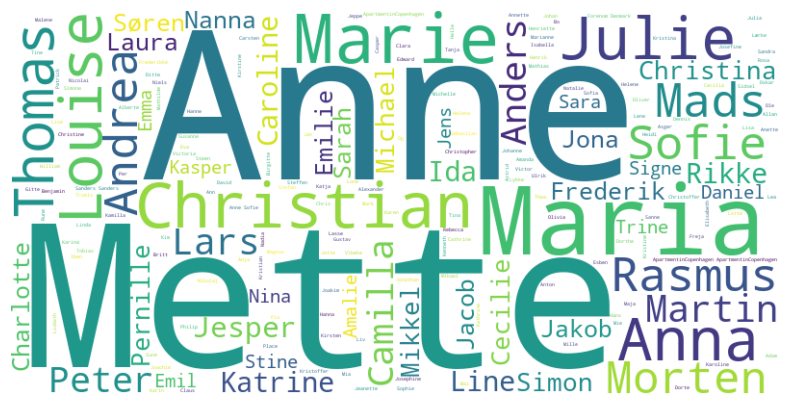

In [26]:
# Converting the 'host_name' column to a single string
my_text = ' '.join(data_filtered['host_name'].astype(str))

# Creating and generating a word cloud, without the "stopwords" as they don't appear in the target column
mywordcloud = WordCloud(background_color="white", width=800, height=400).generate(my_text)

# Displaying the generated word cloud
plt.figure(figsize=(10, 5))
plt.imshow(mywordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

#Whenever we generate the word cloud we see Anne and Mette as biggest names, which corresponds to Denmark Statistics

### 2. Using non-scaled versions of latitude and longitude, plot the listings data on a map.

In [27]:
# Visualizing geographical information from listings on a map
# This solution is fast, but not that pretty
import plotly.express as px

# Example data (you can replace this with your own)
denmark_points = data_filtered

# Create a geographical scatter plot
fig = px.scatter_geo(
    denmark_points,
    lat="latitude",
    lon="longitude",
    hover_name='name',
    projection="natural earth",
    scope='europe',
    fitbounds='locations',
    title='Airbnbs in Copenhagen'
)

#displaying the map :)
fig

In [28]:
# This solution is slow, but very pretty
import folium

# Copenhagen's latitude and longitude
copenhagen_coords = [55.6761, 12.5683]

from folium.plugins import MarkerCluster

# Create a map centered around Copenhagen
map = folium.Map(location=copenhagen_coords, zoom_start=13)

marker_cluster = MarkerCluster().add_to(map)

for index, row in data_filtered.iterrows():
    popup_text = f"Name: {row['name']}<br>Price: {row['price']}<br>Neighbourhood: {row['neighbourhood_cleansed']}"
    
    marker = folium.Marker(location=[row['latitude'], row['longitude']], popup=popup_text)

    marker.add_to(marker_cluster)

# Display the map
map

### 3. Create boxplots where you have the neighbourhood on the x-axis and price on the y-axis. What does this tell you about the listings in Copenhagen? Keep the x-axis as is and move different variables into the y-axis to see how things are distributed between the neighborhoods to create different plots (your choice).

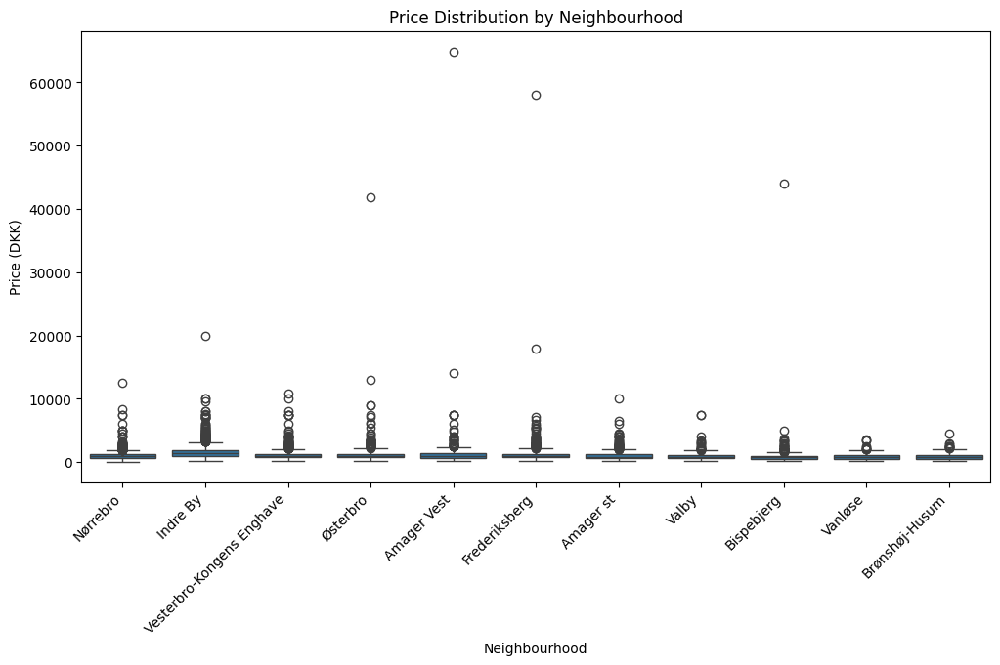

In [29]:
import seaborn as sns
import matplotlib.pyplot as plt
# A boxplot is a visual representation of a data set’s distribution, 
# showing the five-number summary (minimum, quartiles, and maximum) along with any outliers. 
# It helps analyze spread, symmetry, and skewness in the data.
# Creating a boxplot of price by neighborhood
plt.figure(figsize=(12, 6))
sns.boxplot(x='neighbourhood_cleansed', y='price', data=data_filtered)
plt.xticks(rotation=45, ha='right')
plt.title('Price Distribution by Neighbourhood')
plt.xlabel('Neighbourhood')
plt.ylabel('Price (DKK)')
plt.show()

C:\Users\ninaw\AppData\Local\Temp\ipykernel_2916\992117698.py:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



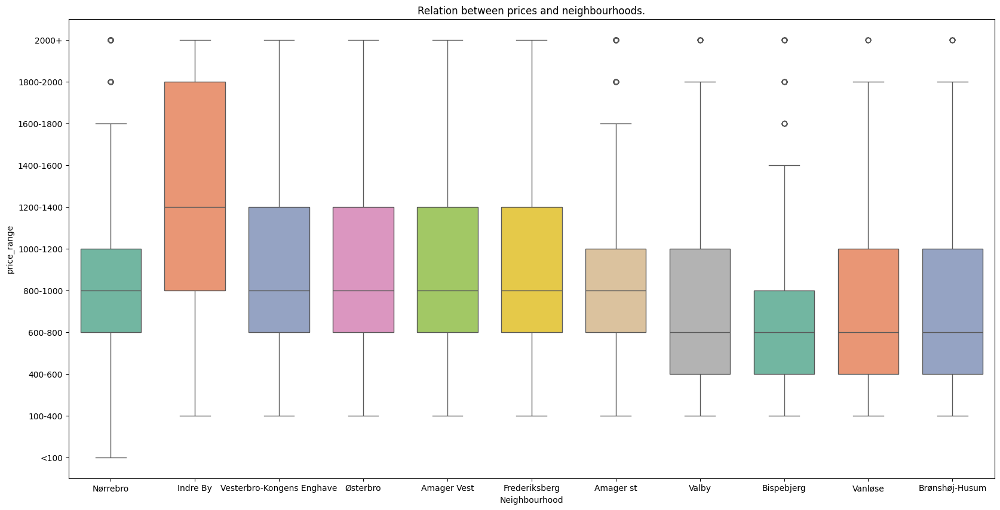

In [30]:
import numpy as np
#THIS SOLUTION INTRODUCES price_range FOR BETTER VISUALIZATION OF DATA
# Preparing data
prepared_data = data_filtered[['neighbourhood_cleansed', 'price']]
prepared_data.dropna()

# Defining bin boundaries and category names
bins = [0, 100, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000, np.inf]
labels = ['<100', '100-400', '400-600', "600-800", "800-1000", "1000-1200", "1200-1400", "1400-1600", "1600-1800", "1800-2000", "2000+"]

# Introducing price_range
# Create a new column 'price_range' with categorical values
prepared_data['price_range'] = pd.cut(prepared_data['price'], bins=bins, labels=labels)

# Setting the desired width and height
plt.figure(figsize=(20, 10)) 
plt.title("Relation between prices and neighbourhoods.")
plt.xlabel("Neighbourhood")
plt.ylabel("price_range")

# Creating the boxplot
sns.boxplot(data=prepared_data, x="neighbourhood_cleansed", y="price_range", hue="neighbourhood_cleansed", width=0.8, gap=0.1, palette='Set2')

# Flipping the y-axis
plt.gca().invert_yaxis()

# Showing the plot
plt.show()


### 4. Do a descriptive analysis of the neighborhoods. Include information about room type in the analysis as well as one other self-chosen feature. The descriptive analysis should contain mean/average, mode, median, standard deviation/variance, minimum, maximum and quartiles.

In [31]:
#DESCRIPTIVE ANALYSIS
# Group the data by neighbourhood, room type and minimum nights
grouped_data = data_filtered.groupby(['neighbourhood_cleansed', 'room_type', 'minimum_nights'])

# Perform a descriptive analysis of the price
descriptive_analysis = grouped_data['price'].describe()

# Calculate mode separately
mode = grouped_data['price'].apply(lambda x: x.mode().iloc[0])

# Concatenate mode with descriptive_analysis
descriptive_analysis['mode'] = mode

# Output the concatenated DataFrame to a CSV file
# Quartiles are described as 25%, 50% and 75%
descriptive_analysis.to_csv('descriptive_analysis.csv')

# Display the result in a CSV file, so it is easier to see the results
print(descriptive_analysis)

                                                       count         mean  \
neighbourhood_cleansed room_type       minimum_nights                       
Amager Vest            Entire home/apt 1               130.0  1239.661538   
                                       2               232.0  1220.034483   
                                       3               209.0  1224.827751   
                                       4               129.0  1317.581395   
                                       5               108.0  1349.685185   
...                                                      ...          ...   
Østerbro               Private room    35                1.0  1500.000000   
                                       45                1.0   260.000000   
                                       100               1.0   283.000000   
                                       105               1.0   291.000000   
                       Shared room     1                 1.0   469.000000   

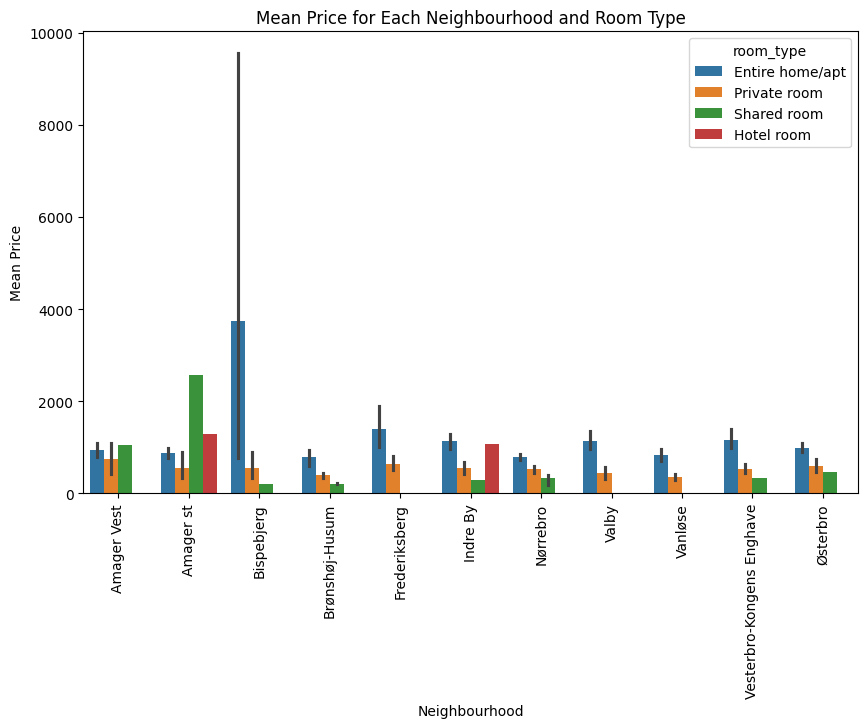

In [32]:
# VISUALIZATION OF MEAN PRICE FOR EACH NEIGHBOURHOOD AND ROOM TYPE
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate mean price for each neighbourhood and room type
mean_price = grouped_data['price'].mean().reset_index()

# Create a figure and axes
fig, ax = plt.subplots(figsize=(10, 6))

# Create a bar plot
sns.barplot(x='neighbourhood_cleansed', y='price', hue='room_type', data=mean_price, ax=ax)

# Rotate x-axis labels for better visibility
plt.xticks(rotation=90)

# Set title and labels
ax.set_title('Mean Price for Each Neighbourhood and Room Type')
ax.set_xlabel('Neighbourhood')
ax.set_ylabel('Mean Price')

# Show the plot
plt.show()

### 5. Based on self-chosen features, develop a logistic regression mode and k-Nearest Neighbor model to determine whether a rental property should be classified as 0 or 1. Remember to divide your data into training data and test data. Comment on your findings.

In [33]:
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
import pandas as pd
from sklearn.impute import SimpleImputer
from datetime import datetime

# load the data
data = pd.read_csv('./listings.csv')

# S Select features and target
features = data[[
    "neighbourhood_cleansed"  ,
    "latitude"  ,
    "longitude"  ,
    "room_type"  ,
    "price"  ,
    "minimum_nights"  ,
    "number_of_reviews",
    "review_scores_rating"  ,
    "review_scores_accuracy" , 
    "review_scores_cleanliness"  ,
    "review_scores_checkin"  ,
    "review_scores_communication"  ,
    "review_scores_location"  ,
    "review_scores_value"  ,
    "reviews_per_month"  ,
    "calculated_host_listings_count"  ,
    "availability_365",
    "host_since",
    "host_acceptance_rate",
    "host_is_superhost",
    "host_listings_count",
    "host_identity_verified",
    "accommodates",
    "bedrooms",
    "beds",
    ]].copy()

# Remove non-numeric characters from 'host_acceptance_rate'
features['host_acceptance_rate'] = features['host_acceptance_rate'].replace('[%,]', '', regex=True)
# Convert the cleaned values to numeric
features['host_acceptance_rate'] = pd.to_numeric(features['host_acceptance_rate'], errors='coerce')

# Convert categorical variables into numerical variables
le = LabelEncoder() #Transforms labels into several (# of unique categories) columns with 0 or 1 values
features['neighbourhood_cleansed'] = le.fit_transform(features['neighbourhood_cleansed'])
features['host_is_superhost'] = le.fit_transform((features['host_is_superhost']))
features['host_identity_verified'] = le.fit_transform((features['host_identity_verified']))
features['room_type'] = le.fit_transform(features['room_type'])

features['price'] = features['price'].replace('[$,]', '', regex=True)
# Convert the cleaned values to numeric
features['price'] = pd.to_numeric(features['price'], errors='coerce')

# Specify the label/target
target = features['price']

features = features.drop('price', axis=1)

## Convert target into binary (0 or 1)
# 0 - cheap, 1 - expensive
median_price = target.median()
target = target > median_price
target = pd.to_numeric(target, errors='coerce')

# Convert 'host_since' to datetime
features['host_since'] = pd.to_datetime(features['host_since'], format='ISO8601')
# Specify a reference date
reference_date = datetime(1980, 1, 1)  # You can choose any reference date
# Calculate the difference between each date and the reference date in days
features['host_since'] = (features['host_since'] - reference_date).dt.days.astype(float)
# Lower value means host has been on the market longer.

# Normalize numerical variables
scaler = StandardScaler()  
features = scaler.fit_transform(features)

# Take NaN values and imput meadian
imputter = SimpleImputer(strategy='mean')
features = imputter.fit_transform(features)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

# Train the KNN model
knn = KNeighborsClassifier(n_neighbors=55)
knn.fit(X_train, y_train)

# Predict the class
y_pred_knn = knn.predict(X_test)

# Calculate and print the accuracy of KNN
accuracy_knn = accuracy_score(y_test, y_pred_knn)
print('KNN accuracy:', accuracy_knn)

KNN accuracy: 0.7549764748461817


Steps in 5-Fold Cross-Validation:
Split the Data:

Divide the dataset into 5 equal (or nearly equal) parts or folds.
Training and Validation:

Perform the following steps five times (one for each fold):
Select one fold as the validation set.
Use the remaining four folds as the training set.
Train the model on the training set.
Evaluate the model on the validation set and record the performance metric (e.g., accuracy, precision, recall).
Aggregate Results:

After performing the above steps five times, calculate the average of the performance metrics obtained in each iteration. This gives a more reliable estimate of the model’s performance.

In [34]:
from sklearn.model_selection import GridSearchCV
#Logistic regression

#Preventing overfitting with regularization.
#Finding best C and checking which (L1 or L2) regularization technique
#works best for this dataset.

# Define the logistic regression model
log_reg = LogisticRegression(solver='saga', max_iter=10000)
#Solver: In the context of logistic regression, the solver is the algorithm used to find the optimal parameters (coefficients) of the model by minimizing the loss function.
#max_iter: This parameter specifies the maximum number of iterations the solver is allowed to run for.

# Define the parameter grid
param_grid = {
    'C': np.logspace(-4, 4, 10),  # C values from 1e-4 to 1e4
    'penalty': ['l1', 'l2']       # Use both L1 and L2 regularization
}

### Finding best parameters for Logistic Regression
# Set up GridSearchCV with 5-fold cross-validation
grid_search = GridSearchCV(estimator=log_reg, param_grid=param_grid, cv=5, scoring='accuracy')

# Fit the model
grid_search.fit(X_train, y_train)

# Best parameters and best score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

# Make predictions with the best model
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)

print(f"Best Parameters: {best_params}")
print(f"Best Cross-Validation Score: {best_score:.4f}")
print(f"Test Set Accuracy: {accuracy:.4f}")



Best Parameters: {'C': 0.046415888336127774, 'penalty': 'l2'}
Best Cross-Validation Score: 0.7465
Test Set Accuracy: 0.7481


In [35]:
# THIS CODE IS CHECKING WHICH K BETWEEN 1 AND 101 GIVES THE BEST POSSIBLE OUTCOME

import numpy as np
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

# Initialize variables to store the best number of neighbors and its corresponding accuracy
best_neighbors = None
best_accuracy = 0

# Define a range of number of neighbors to try
neighbors_range = np.arange(1, 101)

# Iterate over each number of neighbors
for n_neighbors in neighbors_range:
    # Train the KNN model
    knn = KNeighborsClassifier(n_neighbors=n_neighbors)
    knn.fit(X_train, y_train)

    # Predict the class
    y_pred = knn.predict(X_test)

    # Calculate the accuracy
    accuracy = accuracy_score(y_test, y_pred)

    # Update the best number of neighbors and its corresponding accuracy if the current number of neighbors performs better
    if accuracy > best_accuracy:
        best_accuracy = accuracy
        best_neighbors = n_neighbors

# Print the best number of neighbors and its corresponding accuracy
print('Best number of neighbors:', best_neighbors)
print('Best accuracy:', round(best_accuracy, 4))


Best number of neighbors: 55
Best accuracy: 0.755


In [36]:
# We learned that there can be different results depending on the algorithm and features we used (kNN or Regression).
# Depending on which features we were basing out predictions on - we needed to use different "k" in kNN algorithm 
# in order to get the best possible predictions with those features.
# Using these algorithms it's very difficult to tell which features impact the probability the most.

# The best KNN accuracy and Logistic Regression accuracy we could get:
# KNN accuracy: 0.755
# Logistic Regression accuracy: 0.7481